## DS2과정 2기 10조 HW5 - Data Visualization
#### (장용철, 이현영, 권준오)

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
originData = pd.read_csv('C:\Project\data\creditcard.csv', index_col='Time')

In [3]:
originData.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
Time,,,,,,,,,,,,,,,,,,,,,
0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


## 1. 데이터 분포 확인

In [4]:
originData = originData.drop('Amount',axis=1)
originData.describe()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Class
count,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,...,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000
mean,3.919560e-15,5.688174e-16,-8.769071e-15,2.782312e-15,-1.552563e-15,2.010663e-15,-1.694249e-15,-1.927028e-16,-3.137024e-15,1.768627e-15,...,5.085503e-16,1.537294e-16,7.959909e-16,5.367590e-16,4.458112e-15,1.453003e-15,1.699104e-15,-3.660161e-16,-1.206049e-16,0.001727
std,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,1.088850e+00,...,7.709250e-01,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,0.041527
min,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,-2.458826e+01,...,-5.449772e+01,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000
25%,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,-5.354257e-01,...,-2.117214e-01,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,0.000000
50%,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,-9.291738e-02,...,-6.248109e-02,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,0.000000
75%,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,4.539234e-01,...,1.330408e-01,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,0.000000
max,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,2.374514e+01,...,3.942090e+01,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,1.000000


#### 소수점 이하의 매우 작은수로 구성되어 있으며, 산포가 매우 낮음 (이상치는 없는것으로 판단)

## 2. Class별 데이터 분포 확인

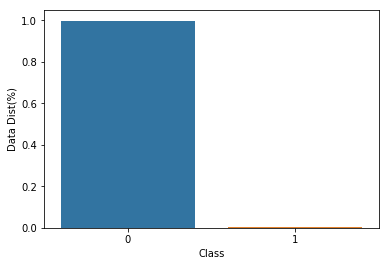

0    0.998273
1    0.001727
Name: Class, dtype: float64

In [5]:
datadis = originData['Class'].value_counts(normalize=True)

g = sns.barplot(x=datadis.index, y=datadis )
plt.xlabel('Class')
plt.ylabel('Data Dist(%)')
plt.show()

datadis

#### Class 0인 데이터가 99.8%, Class 1인 데이터가 0.001%로 구성되어 있음 
#### Class 0에 Bias되어 있음

## 3. 전체 인자 간 Correlation 확인 (HeatMap)

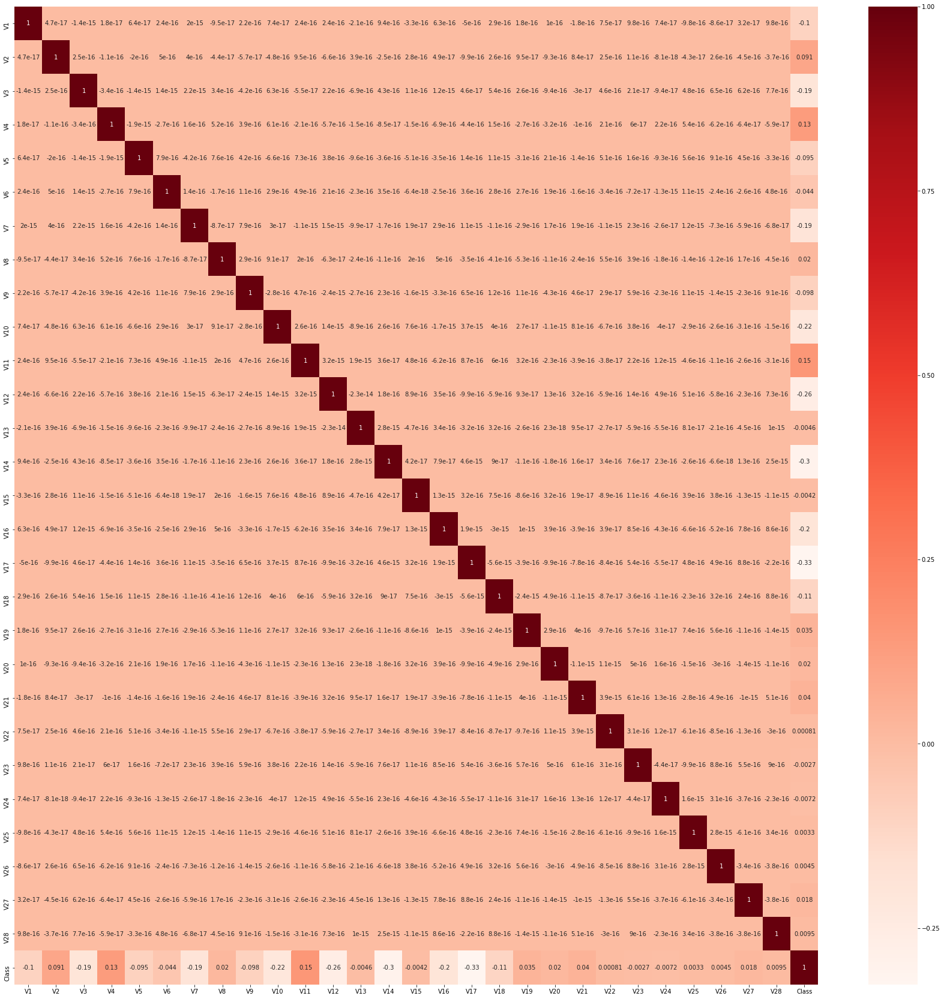

In [6]:
corrdata = originData.corr()

plt.figure(figsize=(30,30))
sns.heatmap(corrdata, annot=True, cmap="Reds")

#### Class와 연관성이 높은 인자는 V17, V14, V12, V10, V7, V3 인것으로 확인됨

## 4. Class 차이에 대한 데이터 분포 확인

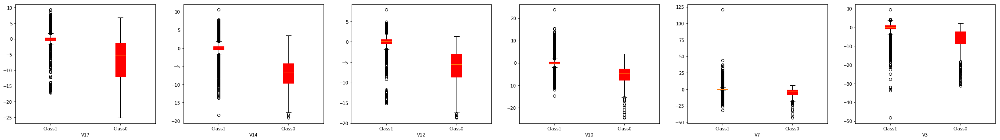

In [7]:
collist = ['V17','V14','V12','V10','V7','V3']
length = len(collist)

fig, axs = plt.subplots(1,6,figsize=(40,5))
cidx=0
for col in collist:
    c0 = np.array(originData[originData['Class']==0][col])
    c1 = np.array(originData[originData['Class']==1][col])
    c_data = [c0,c1]
    axs[cidx].boxplot(c_data,labels=['Class1','Class0'], patch_artist=True,boxprops=dict(facecolor='red', color='red'))
    axs[cidx].set_xlabel(col)
    cidx+=1

#### Boxplot으로 확인시 V17, V14, V12, V10, V7, V3 인자의 데이터 분포가 Class별 차이가 존재함

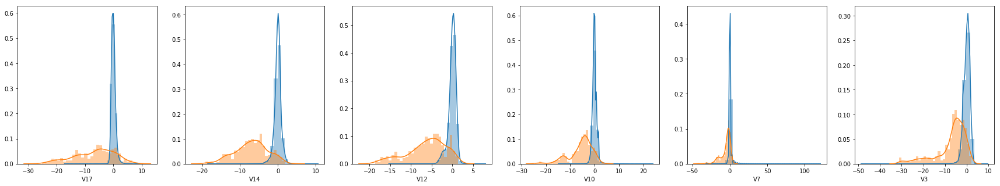

In [8]:
collist = ['V17','V14','V12','V10','V7','V3']
length = len(collist)

fig, axs = plt.subplots(1,6,figsize=(30,5))

cidx=0
for col in collist:
    c0 = np.array(originData[originData['Class']==0][col])
    c1 = np.array(originData[originData['Class']==1][col])
    sns.distplot(c0,bins=30,ax=axs[cidx])
    sns.distplot(c1,bins=30,ax=axs[cidx])
    axs[cidx].set_xlabel(col)
    cidx+=1    

#### V17, V14, V12, V10, V7, V3 인자의 Histogram을 확인하여 Class별 데이터 분포의 차이가 있음을 확인

## 5. 전체 인자에 대한 Pairplot 확인

#### 전체 데이터 Size가 28만건으로, Pairplot 차트 확인을 위해 10%만 random sampling해서 데이터 분석
#### 데이터 random sampling (10%) - 2.8만건

In [9]:
sampleData = originData.sample(frac=0.1)
collist = sampleData.columns

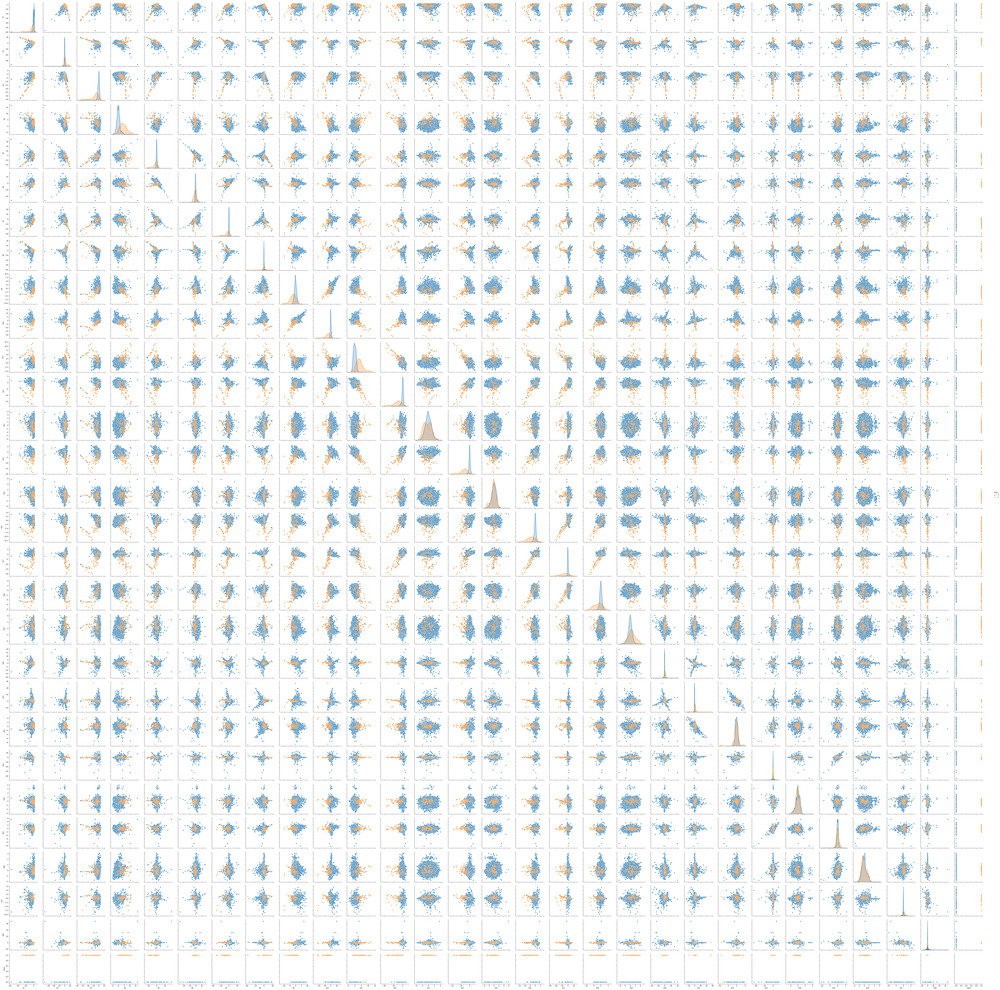

In [10]:
snsplot = sns.pairplot(sampleData,x_vars=collist, y_vars=collist, hue='Class',size=3)

#### V1~V18까지 인자가 상관관계 유의차가 있는것으로 판단됨

## 6. Class를 제외한 인자에 대한 Corr 수치 확인

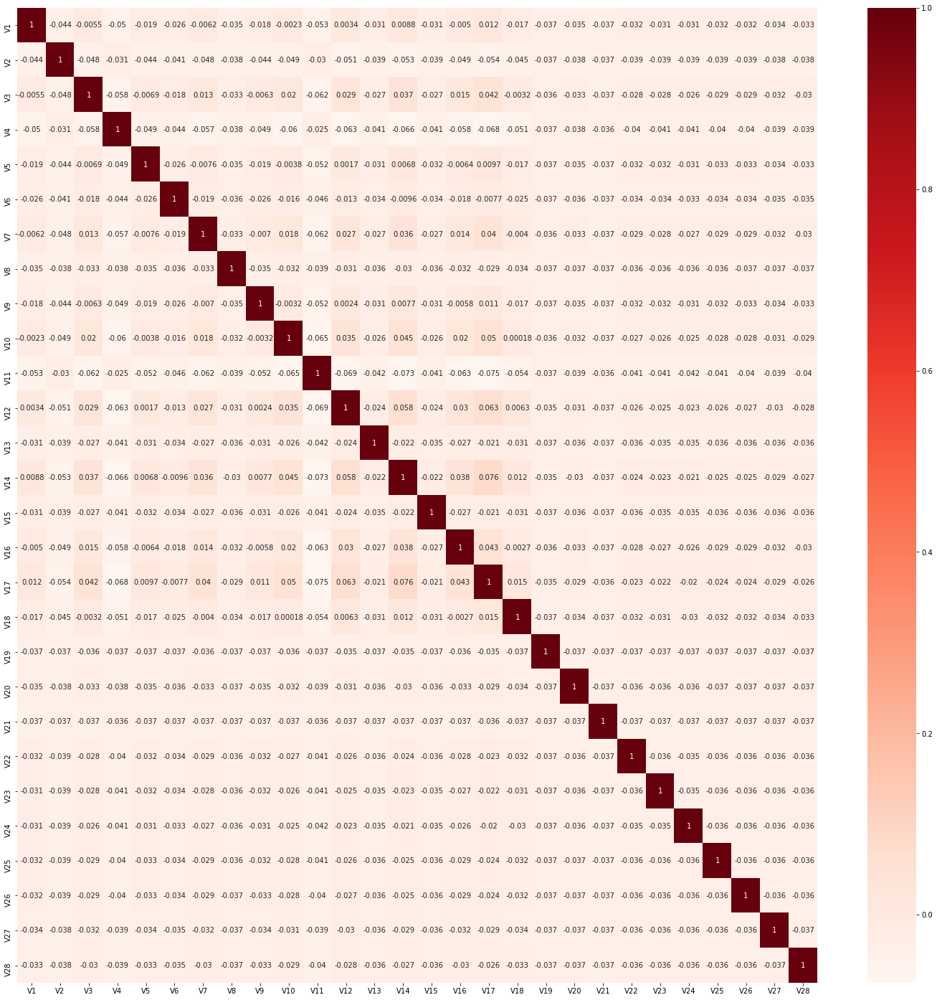

In [11]:
corrdata = corrdata.drop('Class',axis=1).corr()

plt.figure(figsize=(25,25))
sns.heatmap(corrdata, annot=True, cmap="Reds")

#### V1~V18번 항목들이 상관계수의 유의차가 존재함
#### 상관계수가 큰 항목은 V17-V11, V17-V14, V1-V4, V1-V3, V10-V4, V14-V4

## 6. 상관계수가 높은 인자의 분포 확인 (원본데이터)

<Figure size 720x720 with 0 Axes>

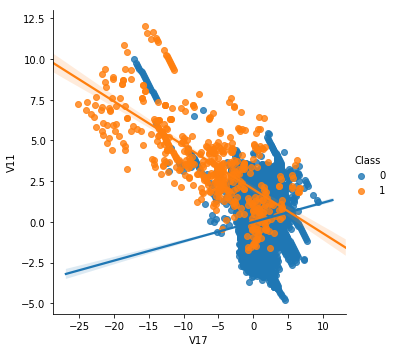

In [12]:
plt.figure(figsize=(10,10))
lm_plot = sns.lmplot(x='V17', y='V11', data=originData, hue='Class')

<Figure size 720x720 with 0 Axes>

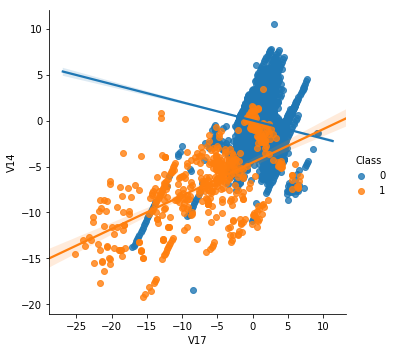

In [13]:
plt.figure(figsize=(10,10))
lm_plot = sns.lmplot(x='V17', y='V14', data=originData, hue='Class')

<Figure size 720x720 with 0 Axes>

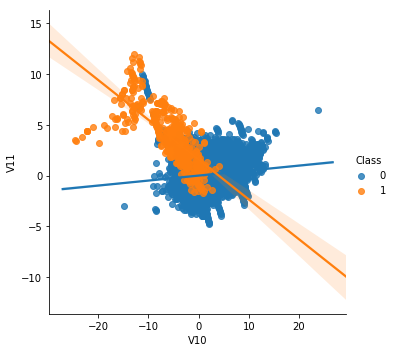

In [14]:
plt.figure(figsize=(10,10))
lm_plot = sns.lmplot(x='V10', y='V11', data=originData, hue='Class')

<Figure size 720x720 with 0 Axes>

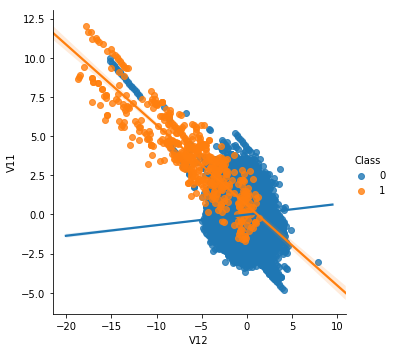

In [15]:
plt.figure(figsize=(10,10))
lm_plot = sns.lmplot(x='V12', y='V11', data=originData, hue='Class')

<Figure size 720x720 with 0 Axes>

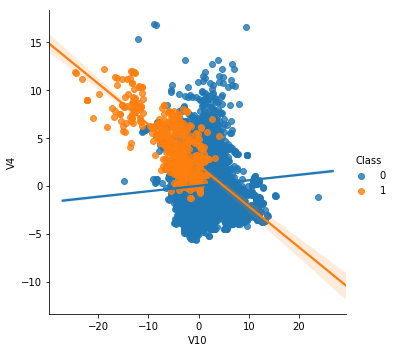

In [16]:
plt.figure(figsize=(10,10))
lm_plot = sns.lmplot(x='V10', y='V4', data=originData, hue='Class')

<Figure size 720x720 with 0 Axes>

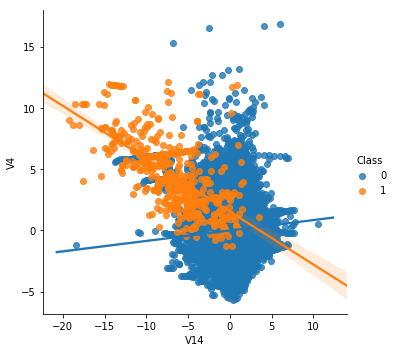

In [17]:
plt.figure(figsize=(10,10))
lm_plot = sns.lmplot(x='V14', y='V4', data=originData, hue='Class')

#### 분석 Case 모두 Class별 서로 상반된 상관관계를 가지는것을 확인함